In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

from pandas.plotting import scatter_matrix
from pandas import DataFrame, read_csv

import os, sys

import glob

## Combine CSV files into 1 dataframe

In [3]:
#get list of csv files from directory

csvlist = glob.glob("*.csv")
print(csvlist) 

['pbp-2014.csv', 'pbp-2015.csv', 'pbp-2016.csv', 'pbp-2017.csv', 'pbp-2018.csv', 'pbp-2019.csv', 'pbp-2020.csv', 'pbp-2021.csv']


In [4]:
#combine csv files into one dataframe

total = 0

tmp = pd.DataFrame()

for x in csvlist:
    df = pd.read_csv(x)
    tmp = tmp.append(df)
    total += len(df)
    #realresults.append(df)
    
print(repr(total) + " - Total Rows")

display(tmp)

340980 - Total Rows


,GameId,GameDate,Quarter,Minute,Second,OffenseTeam,DefenseTeam,Down,ToGo,YardLine,...,IsTwoPointConversion,IsTwoPointConversionSuccessful,RushDirection,YardLineFixed,YardLineDirection,IsPenaltyAccepted,PenaltyTeam,IsNoPlay,PenaltyType,PenaltyYards
0,2014113007,2014-11-30,4,2,0,LA,LV,4,3,50,...,0,0,NaN,50,OPP,0,NaN,0,NaN,0
1,2014113007,2014-11-30,4,2,55,LA,LV,2,3,50,...,0,0,CENTER,50,OPP,0,NaN,0,NaN,0
2,2014113007,2014-11-30,4,3,39,LA,LV,1,10,43,...,0,0,CENTER,43,OWN,0,NaN,0,NaN,0
3,2014113007,2014-11-30,4,5,24,LA,LV,0,0,35,...,0,0,NaN,35,OWN,0,NaN,0,NaN,0
4,2014113007,2014-11-30,4,7,31,LA,LV,4,6,40,...,0,0,NaN,40,OWN,0,NaN,0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24368,2021091200,2021-09-12,2,0,9,PHI,ATL,1,9,91,...,0,0,NaN,9,OPP,0,NaN,0,NaN,0
24369,2021091200,2021-09-12,2,0,15,NaN,NaN,0,0,100,...,0,0,NaN,0,OPP,0,NaN,0,NaN,0
24370,2021091200,2021-09-12,2,2,0,NaN,NaN,0,0,100,...,0,0,NaN,0,OPP,0,NaN,0,NaN,0
24371,2021091200,2021-09-12,1,0,9,ATL,PHI,1,7,93,...,0,0,NaN,7,OPP,1,ATL,1,FALSE START,5


In [5]:
tmp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 340980 entries, 0 to 24372
Data columns (total 45 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   GameId                          340980 non-null  int64  
 1   GameDate                        340980 non-null  object 
 2   Quarter                         340980 non-null  int64  
 3   Minute                          340980 non-null  int64  
 4   Second                          340980 non-null  int64  
 5   OffenseTeam                     315161 non-null  object 
 6   DefenseTeam                     334899 non-null  object 
 7   Down                            340980 non-null  int64  
 8   ToGo                            340980 non-null  int64  
 9   YardLine                        340980 non-null  int64  
 10  Unnamed: 10                     0 non-null       float64
 11  SeriesFirstDown                 340980 non-null  int64  
 12  Unnamed: 12      

In [6]:
##drop empty columns
tmp = tmp.drop(tmp.columns[[10,12,16,17,30]], axis=1)

print(tmp.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 340980 entries, 0 to 24372
Data columns (total 40 columns):
 #   Column                          Non-Null Count   Dtype 
---  ------                          --------------   ----- 
 0   GameId                          340980 non-null  int64 
 1   GameDate                        340980 non-null  object
 2   Quarter                         340980 non-null  int64 
 3   Minute                          340980 non-null  int64 
 4   Second                          340980 non-null  int64 
 5   OffenseTeam                     315161 non-null  object
 6   DefenseTeam                     334899 non-null  object
 7   Down                            340980 non-null  int64 
 8   ToGo                            340980 non-null  int64 
 9   YardLine                        340980 non-null  int64 
 10  SeriesFirstDown                 340980 non-null  int64 
 11  NextScore                       340980 non-null  int64 
 12  Description                    

In [7]:
newdf = tmp.reset_index(drop=True)

## Gather scores from each of the games (GameId)

In [9]:
score = []

length = newdf.shape[0]
count = 0



for x in range(0,len(newdf)):
    #need to remove NaN values from dataframe
    descriptionString = str(newdf["Description"][x])
    if "TOUCHDOWN NULLIFIED" not in descriptionString and "TOUCHDOWN" in descriptionString:
        #print(str(count) + " " + "Touchdown")
        score.append(6)
    elif "FIELD GOAL IS GOOD" in descriptionString:
        print(str(count) + " " + "FIELD GOAL")
        score.append(3)
    elif "EXTRA POINT IS GOOD" in descriptionString:
        #print(str(count) + " " + "EXTRA POINT")
        score.append(1)
    elif "SAFETY" in descriptionString:
        #print(str(count) + " " + "SAFETY")
        score.append(2)
    elif "ATTEMPT SUCCEEDS" in descriptionString:
        #print(str(count) + " " + "2-POINT CONVERSION")
        score.append(2)
    else:
        #print(str(count) + " " + "NON SCORING PLAY")
        score.append(0)
    count += 1
#print(score)


0 NON SCORING PLAY
1 NON SCORING PLAY
2 NON SCORING PLAY
3 NON SCORING PLAY
4 NON SCORING PLAY
5 NON SCORING PLAY
6 NON SCORING PLAY
7 NON SCORING PLAY
8 NON SCORING PLAY
9 EXTRA POINT
10 Touchdown
11 NON SCORING PLAY
12 NON SCORING PLAY
13 NON SCORING PLAY
14 NON SCORING PLAY
15 NON SCORING PLAY
16 NON SCORING PLAY
17 NON SCORING PLAY
18 NON SCORING PLAY
19 NON SCORING PLAY
20 NON SCORING PLAY
21 NON SCORING PLAY
22 NON SCORING PLAY
23 NON SCORING PLAY
24 NON SCORING PLAY
25 NON SCORING PLAY
26 NON SCORING PLAY
27 NON SCORING PLAY
28 NON SCORING PLAY
29 NON SCORING PLAY
30 NON SCORING PLAY
31 NON SCORING PLAY
32 NON SCORING PLAY
33 NON SCORING PLAY
34 FIELD GOAL
35 NON SCORING PLAY
36 NON SCORING PLAY
37 NON SCORING PLAY
38 NON SCORING PLAY
39 NON SCORING PLAY
40 EXTRA POINT
41 Touchdown
42 NON SCORING PLAY
43 NON SCORING PLAY
44 NON SCORING PLAY
45 NON SCORING PLAY
46 NON SCORING PLAY
47 EXTRA POINT
48 Touchdown
49 NON SCORING PLAY
50 NON SCORING PLAY
51 EXTRA POINT
52 Touchdown
53 N

In [10]:
##combine scores with dataframe

newdf["Score"] = score

In [11]:
newdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340980 entries, 0 to 340979
Data columns (total 41 columns):
 #   Column                          Non-Null Count   Dtype 
---  ------                          --------------   ----- 
 0   GameId                          340980 non-null  int64 
 1   GameDate                        340980 non-null  object
 2   Quarter                         340980 non-null  int64 
 3   Minute                          340980 non-null  int64 
 4   Second                          340980 non-null  int64 
 5   OffenseTeam                     315161 non-null  object
 6   DefenseTeam                     334899 non-null  object
 7   Down                            340980 non-null  int64 
 8   ToGo                            340980 non-null  int64 
 9   YardLine                        340980 non-null  int64 
 10  SeriesFirstDown                 340980 non-null  int64 
 11  NextScore                       340980 non-null  int64 
 12  Description                   

## Group scores by GameId

In [12]:
groupbydf = newdf.groupby('GameId', as_index = False)['Score'].sum()

In [82]:
display(groupbydf)

,GameId,Score
0,2014090400,52
1,2014090700,71
2,2014090701,39
3,2014090702,43
4,2014090703,22
5,2014090704,36
6,2014090705,53
7,2014090706,36
8,2014090707,50
9,2014090708,57


In [71]:
print(groupbydf.describe())

             Score
count  1906.000000
mean     47.050367
std      14.304950
min       6.000000
25%      37.000000
50%      46.000000
75%      57.000000
max     111.000000


In [72]:
import matplotlib.pyplot as plt

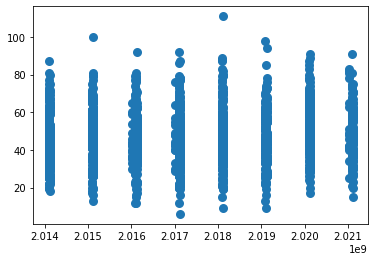

In [14]:
x = groupbydf['GameId'].tolist()
y = groupbydf['Score'].tolist()

plt.scatter(x, y,lw = 3)
plt.show()

In [29]:
Year = []

for x in range(0,1906):
    Year.append(str(groupbydf["GameId"][x])[0:4])


['2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014', '2014',

In [31]:
groupbydf["Year"] = Year

display(groupbydf)

,GameId,Score,Year
0,2014090400,52,2014
1,2014090700,71,2014
2,2014090701,39,2014
3,2014090702,43,2014
4,2014090703,22,2014
...,...,...,...
1901,2021110708,51,2021
1902,2021110709,20,2021
1903,2021110710,48,2021
1904,2021110711,50,2021


## Group scores by Year 

In [38]:
averageScorebyYeardf = groupbydf.groupby("Year", as_index = False)["Score"].mean()

In [39]:
display(averageScorebyYeardf)

,Year,Score
0,2014,45.644531
1,2015,46.779167
2,2016,46.125000
3,2017,45.147601
4,2018,47.874016
5,2019,46.497890
6,2020,50.633333
7,2021,48.625000


## Visualization of Average Score by Year

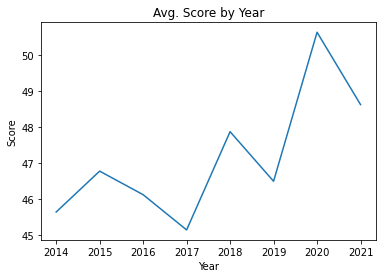

In [41]:
plt.plot(averageScorebyYeardf["Year"], averageScorebyYeardf["Score"])
plt.title('Avg. Score by Year')
plt.xlabel('Year')
plt.ylabel('Score')
plt.show()